In [40]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import scipy
import tensorflow as tf


In [41]:
#pre processing

dataset = pd.read_csv('Orange_Telecom_Churn_Data.csv')


In [42]:
missing_data=dataset.isnull().sum().sort_values(ascending = False)
print(missing_data)

state                            0
total_eve_calls                  0
number_customer_service_calls    0
total_intl_charge                0
total_intl_calls                 0
total_intl_minutes               0
total_night_charge               0
total_night_calls                0
total_night_minutes              0
total_eve_charge                 0
total_eve_minutes                0
account_length                   0
total_day_charge                 0
total_day_calls                  0
total_day_minutes                0
number_vmail_messages            0
voice_mail_plan                  0
intl_plan                        0
phone_number                     0
area_code                        0
churned                          0
dtype: int64


In [43]:
#To Check column names and total records
dataset_count = dataset.count()
print(dataset_count)

state                            5000
account_length                   5000
area_code                        5000
phone_number                     5000
intl_plan                        5000
voice_mail_plan                  5000
number_vmail_messages            5000
total_day_minutes                5000
total_day_calls                  5000
total_day_charge                 5000
total_eve_minutes                5000
total_eve_calls                  5000
total_eve_charge                 5000
total_night_minutes              5000
total_night_calls                5000
total_night_charge               5000
total_intl_minutes               5000
total_intl_calls                 5000
total_intl_charge                5000
number_customer_service_calls    5000
churned                          5000
dtype: int64


In [44]:
#To view information about the dataset
dataset_info = dataset.info()
print(dataset_info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   int64  
 3   phone_number                   5000 non-null   object 
 4   intl_plan                      5000 non-null   object 
 5   voice_mail_plan                5000 non-null   object 
 6   number_vmail_messages          5000 non-null   int64  
 7   total_day_minutes              5000 non-null   float64
 8   total_day_calls                5000 non-null   int64  
 9   total_day_charge               5000 non-null   float64
 10  total_eve_minutes              5000 non-null   float64
 11  total_eve_calls                5000 non-null   int64  
 12  total_eve_charge               5000 non-null   f

In [45]:
#To view statistical summary of the dataset
dataset_statistics = dataset.describe()
print(dataset_statistics)

       account_length    area_code  number_vmail_messages  total_day_minutes  \
count      5000.00000  5000.000000            5000.000000        5000.000000   
mean        100.25860   436.911400               7.755200         180.288900   
std          39.69456    42.209182              13.546393          53.894699   
min           1.00000   408.000000               0.000000           0.000000   
25%          73.00000   408.000000               0.000000         143.700000   
50%         100.00000   415.000000               0.000000         180.100000   
75%         127.00000   415.000000              17.000000         216.200000   
max         243.00000   510.000000              52.000000         351.500000   

       total_day_calls  total_day_charge  total_eve_minutes  total_eve_calls  \
count      5000.000000       5000.000000        5000.000000      5000.000000   
mean        100.029400         30.649668         200.636560       100.191000   
std          19.831197          9.16206

In [46]:
dataset.describe()

,account_length,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,436.911400,7.755200,180.288900,100.029400,30.649668,200.636560,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400
std,39.69456,42.209182,13.546393,53.894699,19.831197,9.162069,50.551309,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363
min,1.00000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,408.000000,0.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000
50%,100.00000,415.000000,0.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.00000,415.000000,17.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.00000,510.000000,52.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [47]:
dataset.shape

(5000, 21)

In [49]:
dataset

,state,account_length,area_code,phone_number,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churned
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
5,AL,118,510,391-8027,yes,no,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,False
6,MA,121,510,355-9993,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False
7,MO,147,415,329-9001,yes,no,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False
8,LA,117,408,335-4719,no,no,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
9,WV,141,415,330-8173,yes,yes,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False


In [50]:
X = dataset.iloc[:,0:20].values

Y = dataset.iloc[:,20:21].values

In [51]:
#A. To Encode the Categorical Data (State) using LabelEncoder
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()
labelencoder = LabelEncoder()
X[:, 0] = labelencoder.fit_transform(X[:, 0])
X[:, 4] = labelencoder.fit_transform(X[:, 4])
X[:, 5] = labelencoder.fit_transform(X[:, 5])

pd.options.display.max_rows = None
pd.options.display.max_columns = None

print(X)

[[16 128 415 ... 3 2.7 1]
 [35 107 415 ... 3 3.7 1]
 [31 137 415 ... 5 3.29 0]
 ...
 [7 61 415 ... 4 3.67 1]
 [7 109 510 ... 6 2.3 0]
 [46 86 415 ... 16 2.51 0]]


In [52]:
X = pd.DataFrame(X)

In [53]:
X = X.drop(3, axis=1)

In [54]:
X

,0,1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,16,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.7,1
1,35,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1
2,31,137,415,0,0,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0
3,35,84,408,1,0,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,36,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
5,1,118,510,1,0,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.7,0
6,19,121,510,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3
7,24,147,415,1,0,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0
8,18,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1
9,49,141,415,1,1,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0


In [55]:
X.shape

(5000, 19)

In [56]:
Y.shape

(5000, 1)

In [57]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_resampled, Y_resampled = smote.fit_resample(X, Y.ravel())


In [58]:
print("Original dataset shape:", X.shape, Y.shape)
print("Resampled dataset shape:", X_resampled.shape, Y_resampled.shape)


Original dataset shape: (5000, 19) (5000, 1)
Resampled dataset shape: (8586, 19) (8586,)


In [59]:
Y_resampled

array([False, False, False, ...,  True,  True,  True])

In [60]:
# Assuming `Y` is a NumPy array
Y_series = pd.Series(Y_resampled.flatten())  # Convert to pandas Series
value_counts = Y_series.value_counts()

print(value_counts)

False    4293
True     4293
dtype: int64


In [61]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X_resampled, Y_resampled, train_size=0.8, random_state=0)

#Feature Scaling

from sklearn.preprocessing import StandardScaler

standard_scaler = StandardScaler()
X_train_standard = X_train.copy()
X_test_standard = X_test.copy()

X_train_standard = standard_scaler.fit_transform(X_train_standard)
X_test_standard = standard_scaler.transform(X_test_standard)

In [62]:
#building the ann model

import keras
from keras.models import Sequential
from keras.layers import Dense

In [63]:
#Feature Scale the x Variable
X_resampled_standard = X_resampled.copy()
X_resampled_standard = standard_scaler.fit_transform(X_resampled_standard)

In [64]:
from scikeras.wrappers import KerasClassifier

def classifier_optimization(optimizer='adam'):
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=10, kernel_initializer = "glorot_uniform", activation = "relu", input_dim = 19))
    classifier_optimization.add(Dense(units=10, kernel_initializer = "glorot_uniform", activation = "relu"))
    classifier_optimization.add(Dense(units=10, kernel_initializer = "glorot_uniform", activation = "relu"))
    
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer ="glorot_uniform", activation = "sigmoid"))
    classifier_optimization.compile(optimizer = optimizer, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, batch_size=10, epochs=25, verbose = 0)

In [65]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'optimizer': ['adam', 'sgd', 'rmsprop', 'adagrad', 'adadelta','adamax','nadam','ftrl']}

In [66]:
#Import the Stratified KFold Class (For Demo use k=5)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [67]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(batch_size=10, epochs=25, model=<function classifier_optimization at 0x00000183A86C5CA0>, verbose=0),
             n_jobs=-1,
             param_grid={'optimizer': ['adam', 'sgd', 'rmsprop', 'adagrad',
                                       'adadelta', 'adamax', 'nadam', 'ftrl']},
             scoring='accuracy')
   mean_test_score  std_test_score                     params
0         0.918240        0.009037      {'optimizer': 'adam'}
1         0.912878        0.012522       {'optimizer': 'sgd'}
2         0.913933        0.008207   {'optimizer': 'rmsprop'}
3         0.915443        0.007377   {'optimizer': 'adagrad'}
4         0.916373        0.012262  {'optimizer': 'adadelta'}
5         0.910784        0.009368    {'optimizer': 'adamax'}
6         0.915790        0.013348     {'optimizer': 'nadam'}
7         0.911601        0.008318      {'optimizer': 'ftrl'}
BEST ACCURAC

In [68]:
from tensorflow.keras.optimizers import Adam

def classifier_optimization(learning_rate):
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=10, kernel_initializer = "glorot_uniform", activation = "relu", input_dim = 19))
    classifier_optimization.add(Dense(units=10, kernel_initializer = "glorot_uniform", activation = "relu"))
    classifier_optimization.add(Dense(units=10, kernel_initializer = "glorot_uniform", activation = "relu"))
    
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer ="glorot_uniform", activation = "sigmoid"))
    optimizer_setting = Adam(learning_rate= learning_rate)
    
    classifier_optimization.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, learning_rate = 0.001, batch_size=10, epochs=25, verbose = 0)

In [69]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'learning_rate': [ 0.001, 0.01, 0.1, 1]}
              

#Import the Stratified KFold Class (For Demo use k=3)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [70]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(batch_size=10, epochs=25, learning_rate=0.001, model=<function classifier_optimization at 0x00000183A867CC10>, verbose=0),
             n_jobs=-1, param_grid={'learning_rate': [0.001, 0.01, 0.1, 1]},
             scoring='accuracy')
   mean_test_score  std_test_score                    params
0         0.914162        0.010309  {'learning_rate': 0.001}
1         0.915210        0.006403   {'learning_rate': 0.01}
2         0.596197        0.103799    {'learning_rate': 0.1}
3         0.500116        0.000436      {'learning_rate': 1}
BEST ACCURACY SCORE:
0.9152101294126906
 
BEST PARAMETERS:
{'learning_rate': 0.01}
 


In [71]:
def classifier_optimization(kernel_initializer):
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=10, kernel_initializer = kernel_initializer, activation = "relu", input_dim = 19))
    classifier_optimization.add(Dense(units=10, kernel_initializer = kernel_initializer, activation = "relu"))
    classifier_optimization.add(Dense(units=10, kernel_initializer = kernel_initializer, activation = "relu"))
    
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer = kernel_initializer, activation = "sigmoid"))
    optimizer_setting = Adam(learning_rate= 0.01)
    
    classifier_optimization.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, kernel_initializer = 'uniform', batch_size=10, epochs=25, verbose = 0)

In [72]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'kernel_initializer': ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']}              

#Import the Stratified KFold Class (For Demo use k=3)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [74]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(batch_size=10, epochs=25, kernel_initializer='uniform', model=<function classifier_optimization at 0x00000183A4167E50>, verbose=0),
             n_jobs=-1,
             param_grid={'kernel_initializer': ['uniform', 'lecun_uniform',
                                                'normal', 'zero',
                                                'glorot_normal',
                                                'glorot_uniform', 'he_normal',
                                                'he_uniform']},
             scoring='accuracy')
   mean_test_score  std_test_score                                    params
0         0.914626        0.008766         {'kernel_initializer': 'uniform'}
1         0.912881        0.009933   {'kernel_initializer': 'lecun_uniform'}
2         0.867831        0.122751          {'kernel_initializer': 'normal'}
3         0.500000        0.000451    

In [78]:
def classifier_optimization(activation1, activation2, activation3, activation4):
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=10, kernel_initializer = 'he_normal', activation = activation1, input_dim = 19))
    classifier_optimization.add(Dense(units=10, kernel_initializer = 'he_normal', activation = activation2))
    classifier_optimization.add(Dense(units=10, kernel_initializer = 'he_normal', activation = activation3))
    
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer = 'he_normal', activation = activation4))
    optimizer_setting = Adam(learning_rate= 0.01)
    
    classifier_optimization.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, activation1 = 'relu', activation2='relu', activation3='relu', activation4='relu', batch_size=10, epochs=25, verbose = 0)

In [79]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'activation1': [ 'softmax', 'relu', 'tanh', 'sigmoid','exponential','elu', 'leakyrelu'],
              'activation2': [ 'softmax', 'relu', 'tanh', 'sigmoid','exponential','elu', 'leakyrelu'],
              'activation3': [ 'softmax', 'relu', 'tanh', 'sigmoid','exponential','elu', 'leakyrelu'],
              'activation4': [ 'softmax', 'relu', 'tanh', 'sigmoid','exponential','elu', 'leakyrelu']
              }
              

#Import the Stratified KFold Class (For Demo use k=3)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [81]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')

C:\ProgramData\Anaconda3\envs\python39\lib\site-packages\joblib\externals\loky\process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\python39\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
11050 fits failed out of a total of 24010.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2160 fits failed with the following error:
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\envs\python39\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(activation1='relu', activation2='relu', activation3='relu', activation4='relu', batch_size=10, epochs=25, model=<function classifier_optimization at 0x00000183A48DCEE0>, verbose=0),
             n_jobs=-1,
             param_grid={'activation1': ['softmax', 'relu', 'tanh', 'sigmoid',
                                         'exponential', 'elu', 'leakyrelu'],
                         'activation2': ['softmax', 'relu', 'tanh', 'sigmoid',
                                         'exponential', 'elu', 'leakyrelu'],
                         'activation3': ['softmax', 'relu', 'tanh', 'sigmoid',
                                         'exponential', 'elu', 'leakyrelu'],
                         'activation4': ['softmax', 'relu', 'tanh', 'sigmoid',
                                         'exponential', 'elu', 'leakyrelu']},
             scoring='accuracy')
      mean_test_score

In [83]:
from keras.layers import Dropout

def classifier_optimization(dropout_rate):
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=10, kernel_initializer = 'he_normal', activation = 'softmax', input_dim = 19))
    classifier_optimization.add(Dropout(rate=dropout_rate))
    classifier_optimization.add(Dense(units=10, kernel_initializer = 'he_normal', activation ='sigmoid'))
    classifier_optimization.add(Dropout(rate=dropout_rate))
    classifier_optimization.add(Dense(units=10, kernel_initializer = 'he_normal', activation ='exponential'))
    classifier_optimization.add(Dropout(rate=dropout_rate))
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer = 'he_normal', activation = 'sigmoid'))
    classifier_optimization.add(Dropout(rate=dropout_rate))
    optimizer_setting = Adam(learning_rate= 0.01)
    
    classifier_optimization.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, dropout_rate=0.0, batch_size=10, epochs=25, verbose = 0)

In [84]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'dropout_rate': [ 0.0, 0.2, 0.4, 0.6, 0.8]}
              

#Import the Stratified KFold Class (For Demo use k=3)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [85]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(batch_size=10, dropout_rate=0.0, epochs=25, model=<function classifier_optimization at 0x00000183A44F31F0>, verbose=0),
             n_jobs=-1, param_grid={'dropout_rate': [0.0, 0.2, 0.4, 0.6, 0.8]},
             scoring='accuracy')
   mean_test_score  std_test_score                 params
0         0.918938        0.008608  {'dropout_rate': 0.0}
1         0.879329        0.032675  {'dropout_rate': 0.2}
2         0.827935        0.120617  {'dropout_rate': 0.4}
3         0.500000        0.000451  {'dropout_rate': 0.6}
4         0.499767        0.000386  {'dropout_rate': 0.8}
BEST ACCURACY SCORE:
0.9189378336060525
 
BEST PARAMETERS:
{'dropout_rate': 0.0}
 


In [86]:
def classifier_optimization(neurons1,neurons2,neurons3):
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=neurons1, kernel_initializer = 'he_normal', activation = 'softmax', input_dim = 19))
    classifier_optimization.add(Dropout(rate=0.0))
    classifier_optimization.add(Dense(units=neurons2, kernel_initializer = 'he_normal', activation ='sigmoid'))
    classifier_optimization.add(Dropout(rate=0.0))
    classifier_optimization.add(Dense(units=neurons3, kernel_initializer = 'he_normal', activation ='exponential'))
    classifier_optimization.add(Dropout(rate=0.0))
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer = 'he_normal', activation = 'sigmoid'))
    classifier_optimization.add(Dropout(rate=0.0))
    optimizer_setting = Adam(learning_rate= 0.01)
    
    classifier_optimization.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, neurons1=10, neurons2=10, neurons3=10, batch_size=10, epochs=25, verbose = 0)

In [88]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'neurons1': [ 10,25,50,100 ],
              'neurons2': [ 10,25,50,100 ],
              'neurons3': [ 10,25,50,100 ]}
              

#Import the Stratified KFold Class (For Demo use k=3)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [89]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')

C:\ProgramData\Anaconda3\envs\python39\lib\site-packages\joblib\externals\loky\process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(batch_size=10, epochs=25, model=<function classifier_optimization at 0x00000183A4567790>, neurons1=10, neurons2=10, neurons3=10, verbose=0),
             n_jobs=-1,
             param_grid={'neurons1': [10, 25, 50, 100],
                         'neurons2': [10, 25, 50, 100],
                         'neurons3': [10, 25, 50, 100]},
             scoring='accuracy')
    mean_test_score  std_test_score  \
0          0.914861        0.009417   
1          0.917075        0.007333   
2          0.915562        0.012283   
3          0.921035        0.006952   
4          0.920569        0.008389   
5          0.919055        0.011171   
6          0.918239        0.012555   
7          0.921386        0.009094   
8          0.919056        0.007867   
9          0.917654        0.010463   
10         0.913697        0.007382   
11         0.920686        0.008698   
12         

In [90]:
def classifier_optimization():
    classifier_optimization = Sequential()
    classifier_optimization.add(Dense(units=100, kernel_initializer = 'he_normal', activation = 'softmax', input_dim = 19))
    classifier_optimization.add(Dropout(rate=0.0))
    classifier_optimization.add(Dense(units=25, kernel_initializer = 'he_normal', activation = 'sigmoid'))
    classifier_optimization.add(Dropout(rate=0.0))
    classifier_optimization.add(Dense(units=50, kernel_initializer = 'he_normal', activation = 'exponential'))
    classifier_optimization.add(Dropout(rate=0.0))
    
    #Output Layer
    classifier_optimization.add(Dense(units=1, kernel_initializer ='he_normal', activation = 'sigmoid'))
    optimizer_setting = Adam(learning_rate= 0.01)
    
    classifier_optimization.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimization

ann_model_optimization = KerasClassifier(model = classifier_optimization, verbose = 0)

In [91]:
#Import Gridsearch
from sklearn.model_selection import GridSearchCV

#Set Parameters to be optimized for the ANN Model
parameters = {'batch_size': [10,25,50,100],
              'epochs':[10,50,100]}

#Import the Stratified KFold Class (For Demo use k=5)
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

grid_search = GridSearchCV(estimator = ann_model_optimization,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = k_fold,
                           n_jobs = -1)

In [92]:
grid_search = grid_search.fit(X_resampled_standard, Y_resampled)
print(grid_search)

results = pd.DataFrame(grid_search.cv_results_)[['mean_test_score', 'std_test_score','params']]
print(results)

best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("BEST ACCURACY SCORE:")
print(best_accuracy)
print(' ')


print("BEST PARAMETERS:")
print(best_parameters)
print(' ')

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
             estimator=KerasClassifier(model=<function classifier_optimization at 0x00000183A870E8B0>, verbose=0),
             n_jobs=-1,
             param_grid={'batch_size': [10, 25, 50, 100],
                         'epochs': [10, 50, 100]},
             scoring='accuracy')
    mean_test_score  std_test_score                              params
0          0.936759        0.004730    {'batch_size': 10, 'epochs': 10}
1          0.942581        0.007161    {'batch_size': 10, 'epochs': 50}
2          0.943165        0.005564   {'batch_size': 10, 'epochs': 100}
3          0.937341        0.006838    {'batch_size': 25, 'epochs': 10}
4          0.948057        0.008111    {'batch_size': 25, 'epochs': 50}
5          0.945377        0.009904   {'batch_size': 25, 'epochs': 100}
6          0.936061        0.007416    {'batch_size': 50, 'epochs': 10}
7          0.942000        0.009116    {'batch_size': 50, 'epochs':

In [94]:
#For Optimized Parameters

classifier_optimized = Sequential()
classifier_optimized.add(Dense(units=100, kernel_initializer = 'he_normal', activation = "softmax",  input_dim = 19))
classifier_optimized.add(Dropout(rate=0.0))
classifier_optimized.add(Dense(units=25, kernel_initializer = 'he_normal', activation = "sigmoid"))
classifier_optimized.add(Dropout(rate=0.0))
classifier_optimized.add(Dense(units=50, kernel_initializer = 'he_normal', activation = "exponential"))
classifier_optimized.add(Dropout(rate=0.0))

#Output Layer
classifier_optimized.add(Dense(units=1, kernel_initializer = 'he_normal', activation = "sigmoid"))
classifier_optimized.add(Dropout(rate=0.0))
optimizer_setting = Adam(learning_rate= 0.01)
#Compiling the ann 
classifier_optimized.compile(optimizer = optimizer_setting, loss="binary_crossentropy", metrics = "accuracy")

#Fitting the ann 
classifier_optimized.fit(x = X_resampled_standard, y = Y_resampled, batch_size = 100, epochs = 100)

Epoch 1/100
86/86 [==============================] - 1s 2ms/step - loss: 0.5168 - accuracy: 0.7402
Epoch 2/100
86/86 [==============================] - 0s 2ms/step - loss: 0.2755 - accuracy: 0.8921
Epoch 3/100
86/86 [==============================] - 0s 2ms/step - loss: 0.2183 - accuracy: 0.9171
Epoch 4/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1862 - accuracy: 0.9314
Epoch 5/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1517 - accuracy: 0.9432
Epoch 6/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1367 - accuracy: 0.9500
Epoch 7/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1271 - accuracy: 0.9531
Epoch 8/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1167 - accuracy: 0.9559
Epoch 9/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1072 - accuracy: 0.9614
Epoch 10/100
86/86 [==============================] - 0s 2ms/step - loss: 0.1000 - accuracy: 0.9605
Epoch 11/

86/86 [==============================] - 0s 3ms/step - loss: 0.0117 - accuracy: 0.9972
Epoch 84/100
86/86 [==============================] - 0s 3ms/step - loss: 0.0117 - accuracy: 0.9969
Epoch 85/100
86/86 [==============================] - 0s 4ms/step - loss: 0.0163 - accuracy: 0.9956
Epoch 86/100
86/86 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 0.9963
Epoch 87/100
86/86 [==============================] - 0s 2ms/step - loss: 0.0181 - accuracy: 0.9942
Epoch 88/100
86/86 [==============================] - 0s 2ms/step - loss: 0.0179 - accuracy: 0.9937
Epoch 89/100
86/86 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 0.9967
Epoch 90/100
86/86 [==============================] - 0s 2ms/step - loss: 0.0202 - accuracy: 0.9949
Epoch 91/100
86/86 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 0.9967
Epoch 92/100
86/86 [==============================] - 0s 2ms/step - loss: 0.0116 - accuracy: 0.9974
Epoch 93/100


In [95]:
#initial evaluation
Y_predict_probability = classifier_optimized.predict(X_test_standard)
Y_predict_boolean= (Y_predict_probability > 0.5)
Y_predict = Y_predict_boolean.astype(int)

54/54 [==============================] - 0s 1ms/step


Hold-out Accuracy:
0.9976717112922002
 
CLASSIFICATION REPORT:
              precision    recall  f1-score   support

       False     0.9965    0.9988    0.9976       849
        True     0.9988    0.9965    0.9977       869

    accuracy                         0.9977      1718
   macro avg     0.9977    0.9977    0.9977      1718
weighted avg     0.9977    0.9977    0.9977      1718

 


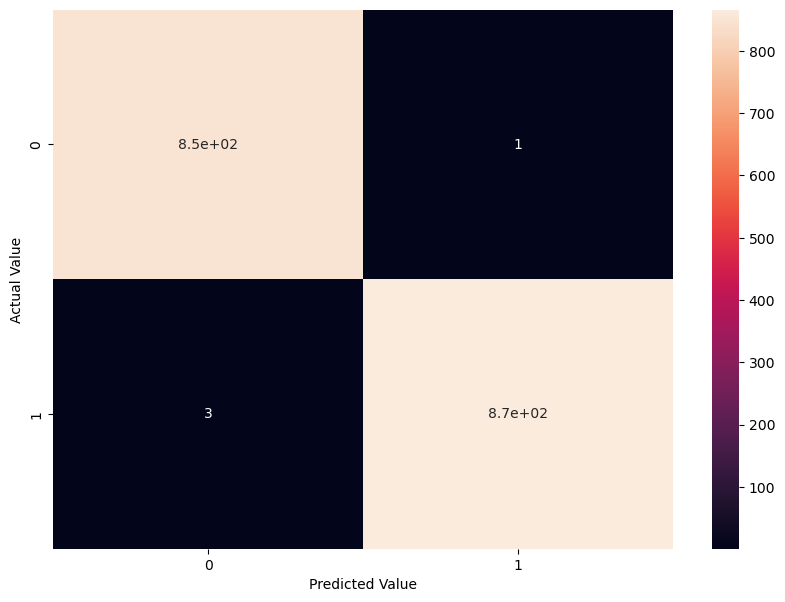

In [112]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(Y_test, Y_predict)

#pip install seaborn
import seaborn as sns
plt.figure(figsize = (10,7))
sns.heatmap(confusion_matrix, annot=True)
plt.xlabel("Predicted Value")
plt.ylabel("Actual Value")

#Hold out accuracy
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(Y_test, Y_predict)
print("Hold-out Accuracy:")
print(accuracy)
print(' ')

from sklearn.metrics import classification_report
print("CLASSIFICATION REPORT:")
print(classification_report(Y_test,Y_predict,digits=4))
print(' ')


In [99]:
#Hold-out Validation 
TP = confusion_matrix[1,1]
TN = confusion_matrix[0,0]
FP = confusion_matrix[0,1]
FN = confusion_matrix[1,0]

In [100]:
#Classification Accuracy  
from sklearn.metrics import accuracy_score
classification_accuracy = accuracy_score(Y_test,Y_predict)    
print("Classification Accuracy: %.4f"
      %classification_accuracy)
print(' ')

Classification Accuracy: 0.9977
 


In [101]:
#Classification Error
classification_error = 1-classification_accuracy
print("Classification Error: %.4f"
      %classification_error)
print(' ')

Classification Error: 0.0023
 


In [102]:
#Recall, Sensitivity, True Positive Rate, Probability of Detection 
from sklearn.metrics import recall_score
recall = recall_score(Y_test,Y_predict)    
print("Recall Score: %.4f"
      %recall)
print(' ')

Recall Score: 0.9965
 


In [103]:
#Specificity or True Negative Rate
specificity = TN / (TN+FP)
print("Specificity: %.4f"
      %specificity)
print(' ')

Specificity: 0.9988
 


In [104]:
#For the False Positive Rate
fpr = 1-specificity
print("FPR: %.4f"
      %fpr)
print(' ')

FPR: 0.0012
 


In [105]:
#Precision or Positive Predictive Value
from sklearn.metrics import precision_score
precision = precision_score(Y_test, Y_predict)
print("Precision: %.4f"
      %precision)
print(' ')

Precision: 0.9988
 


In [106]:
#F1 Score
from sklearn.metrics import f1_score
f1 = f1_score(Y_test, Y_predict)
print("F1: %.4f"
      %f1)
print(' ')

F1: 0.9977
 


In [107]:
#For the Classification Report
from sklearn.metrics import classification_report
cp = classification_report(Y_test, Y_predict)

Text(0, 0.5, 'Recall')

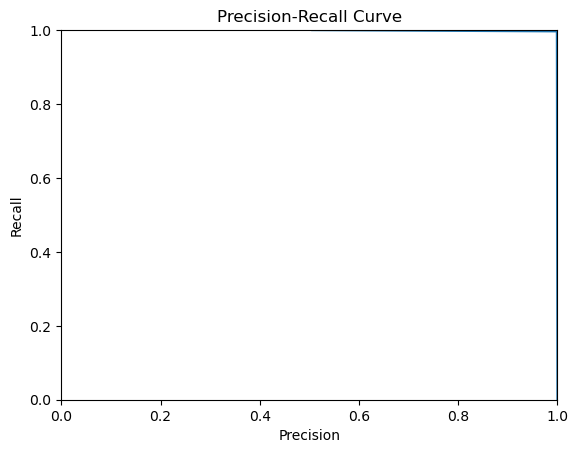

In [108]:
#For the Precision-Recall Curve
from sklearn.metrics import precision_recall_curve
precision_value, recall_value, threshold = precision_recall_curve(Y_test,Y_predict)

plt.plot(precision_value, recall_value)
plt.xlim([0,1])
plt.ylim([0,1])
plt.title("Precision-Recall Curve")
plt.xlabel("Precision")
plt.ylabel("Recall")

In [109]:
#For the ROC
from sklearn.metrics import roc_curve
FPR, TPR, threshold = roc_curve(Y_test, Y_predict)

In [110]:
#For the AUC
from sklearn.metrics import roc_auc_score
auc_score = roc_auc_score(Y_test, Y_predict)

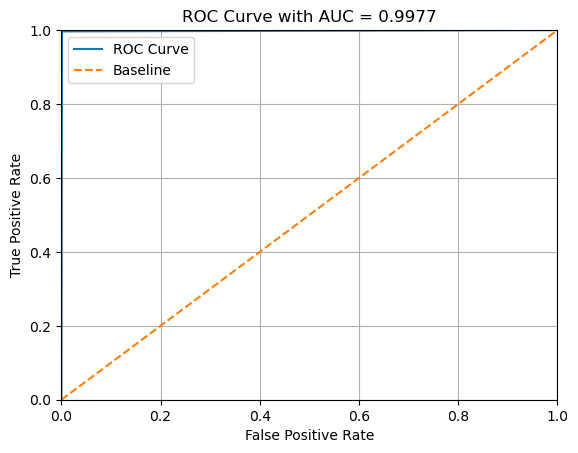

In [113]:
#For the ROC_AUC Curve
plt.plot(FPR, TPR, label = "ROC Curve")
plt.xlim([0,1])
plt.ylim([0,1])



#For the plot baseline for auc
plt.plot(np.linspace(0,1,10), np.linspace(0,1,10), label = "Baseline", linestyle = '--')
plt.title(f'ROC Curve with AUC = {round(auc_score,4)}')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [319]:
#K-fold Cross Validation
#Feature Scale the x Variable
#X_resampled_standard = X_resampled.copy()
#X_resampled_standard = standard_scaler.fit_transform(X_resampled_standard)
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from keras.regularizers import l2

#For Optimized Parameters

def classifier_optimized():
    classifier_optimized = Sequential()
    classifier_optimized.add(Dense(units=100, kernel_initializer = 'he_normal', activation = "softmax", kernel_regularizer = l2(0.01), input_dim = 19))
    classifier_optimized.add(Dropout(rate=0.0))
    classifier_optimized.add(Dense(units=25, kernel_initializer = 'he_normal', activation = "sigmoid"))
    classifier_optimized.add(Dropout(rate=0.0))
    classifier_optimized.add(Dense(units=50, kernel_initializer = 'he_normal', activation = "exponential"))
    classifier_optimized.add(Dropout(rate=0.0))

    #Output Layer
    classifier_optimized.add(Dense(units=1, kernel_initializer = 'he_normal', activation = "sigmoid"))
    classifier_optimized.add(Dropout(rate=0.0))
    
    optimizer_setting = Adam(learning_rate= 0.01)

    
    classifier_optimized.compile(optimizer = optimizer_setting, loss = "binary_crossentropy", metrics = "accuracy")
    return classifier_optimized

ann_model = KerasClassifier(model = classifier_optimized, batch_size = 100, epochs=100, verbose = 0)

In [320]:
#Import the Stratified KFold Class
from sklearn.model_selection import StratifiedKFold
k_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

#Import the cross_val_score Class
from sklearn.model_selection import cross_val_score

In [348]:
#Accuracy 
accuracies = cross_val_score(estimator=ann_model, X=X_resampled_standard, y=Y_resampled, scoring ="accuracy", cv=k_fold, n_jobs=-1)

In [349]:
accuracies_average = accuracies.mean()
accuracies_deviation = accuracies.std()

In [350]:
print("ACCURACIES")
print(accuracies)
print(' ')
print("AVE ACCURACY")
print(accuracies_average)
print(' ')
print("ACCURACY DEVIATION")
print(accuracies_deviation)
print(' ')

ACCURACIES
[0.96576251 0.95994179 0.96576251 0.95528522 0.95994179 0.9576135
 0.95172494 0.96804196 0.96104895 0.96337995]
 
AVE ACCURACY
0.9608503138305234
 
ACCURACY DEVIATION
0.004824813018914157
 


In [351]:
#F1 Score 
f1 = cross_val_score(estimator=ann_model, X=X_resampled_standard, y=Y_resampled, scoring ="f1", cv=k_fold, n_jobs=-1)

In [352]:
f1_average = f1.mean()
f1_deviation = f1.std()

In [353]:
print("F1 SCORE")
print(f1)
print(' ')
print("AVE F1 SCORE")
print(f1_average)
print(' ')
print("F1 SCORE DEVIATION")
print(f1_deviation)
print(' ')

F1 SCORE
[0.96314286 0.96045045 0.95689266 0.96216401 0.96532646 0.94863636
 0.96259594 0.96612009 0.95356659 0.95965675]
 
AVE F1 SCORE
0.9598552167357159
 
F1 SCORE DEVIATION
0.005171206417479407
 


In [354]:
#precision
precision = cross_val_score(estimator=ann_model, X=X_resampled_standard, y=Y_resampled, scoring ="precision", cv=k_fold, n_jobs=-1)
 

In [355]:
precision_average = precision.mean()
precision_deviation = precision.std()

In [356]:
print("Precision")
print(precision)
print(' ')
print("AVE PRECISION SCORE")
print(precision_average)
print(' ')
print("PRECISION DEVIATION")
print(precision_deviation)
print(' ')   

Precision
[0.94959732 0.92521739 0.93841163 0.94318486 0.9305298  0.92503268
 0.93792793 0.94736018 0.94197279 0.93376682]
 
AVE PRECISION SCORE
0.9373001388305117
 
PRECISION DEVIATION
0.008156734800928834
 


In [357]:
# Compute recall scores
recall = cross_val_score(estimator=ann_model, X=X_resampled_standard, y=Y_resampled, scoring="recall", cv=k_fold, n_jobs=-1)


In [358]:
recall_average = recall.mean()
recall_deviation = recall.std()

In [359]:
print("Recall")
print(recall)
print(' ')
print("AVE RECALL SCORE")
print(recall_average)
print(' ')
print("RECALL DEVIATION")
print(recall_deviation)
print(' ')

Recall
[0.98435897 0.98202797 0.98202797 0.9844186  0.96813953 0.98209302
 0.98902098 0.97736597 0.98435897 0.97037296]
 
AVE RECALL SCORE
0.9804184962324498
 
RECALL DEVIATION
0.00624537263606369
 


In [363]:
#ROC_AUC
roc_auc = cross_val_score(estimator=ann_model, X=X_resampled_standard, y=Y_resampled, scoring="roc_auc", cv=k_fold, n_jobs=-1)


In [364]:
roc_auc_average = roc_auc.mean()
roc_auc_deviation = roc_auc.std()

In [365]:
print("ROC AUC SCORE")
print(roc_auc)
print(' ')
print("AVE ROC AUC SCORE")
print(roc_auc_average)
print(' ')
print("ROC AUC DEVIATION")
print(roc_auc_deviation)
print(' ')   

ROC AUC SCORE
[0.98996964 0.99290237 0.99554508 0.99617932 0.99258524 0.98525072
 0.98728495 0.99004792 0.98819779 0.98334018]
 
AVE ROC AUC SCORE
0.9901303223258013
 
ROC AUC DEVIATION
0.004017472313136452
 


In [366]:
auc_score = roc_auc_score(Y_test, Y_predict)

In [367]:
auc_score

0.9976849498699478